Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds

We'll be using data from the Kaggle dog breed identification. It consists of a collection of 10,000+ labelled images of 120 different dog breeds.



In [0]:
# Import TF 2.x
try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass

check whether or not we're using a GPU

In [2]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.2.0
Hub version: 0.8.0
GPU available (YESS!!!!)


GPU is not running, Have to change from Runtime option
And check again to verify

In [3]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.2.0
Hub version: 0.8.0
GPU available (YESS!!!!)


Accessing the data

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     02df8523833c432f90071f86dff69a8f  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


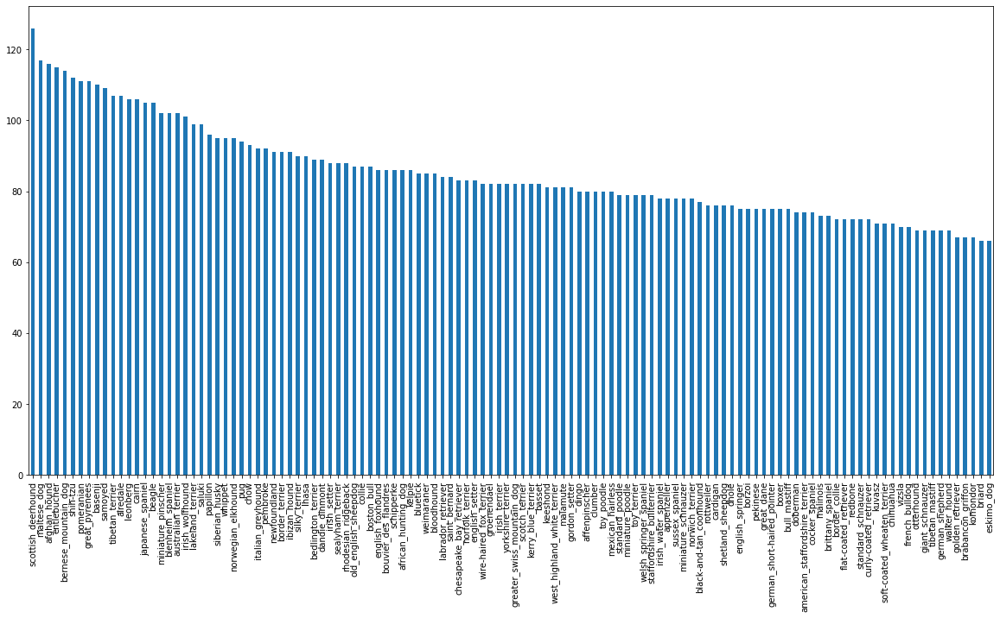

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

From above it is clear that total 120 breeds we have and we have 60+ image of each dog.

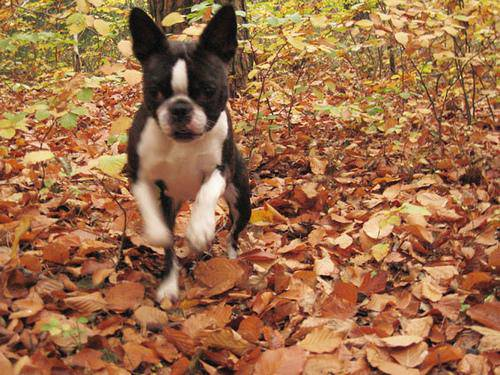

In [6]:
from IPython.display import display, Image
Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [7]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

As we  got our image filepaths together,now do same to get labels.
We'll take them from labels_csv and turn them into a NumPy array

In [8]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [9]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)


120

In [10]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

Creating our own validation set

In [0]:
# Setup X & y variables
X = filenames
y = boolean_labels

Since we are working with more than 10k images. It will take so much time to do experiment so break them into batches. lets take firstly 1000 and then increse after that 

In [12]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [13]:
# Split our data into 80/20
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES 
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

Preprocessing images (turning images into Tensors)


In [14]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

In [15]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [0]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

Creating data batches

In [0]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [0]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [19]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [20]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visualizing data batches

In [0]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

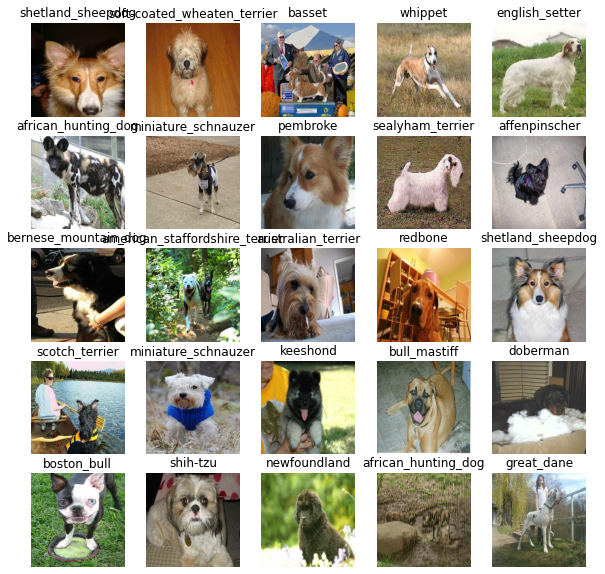

In [22]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

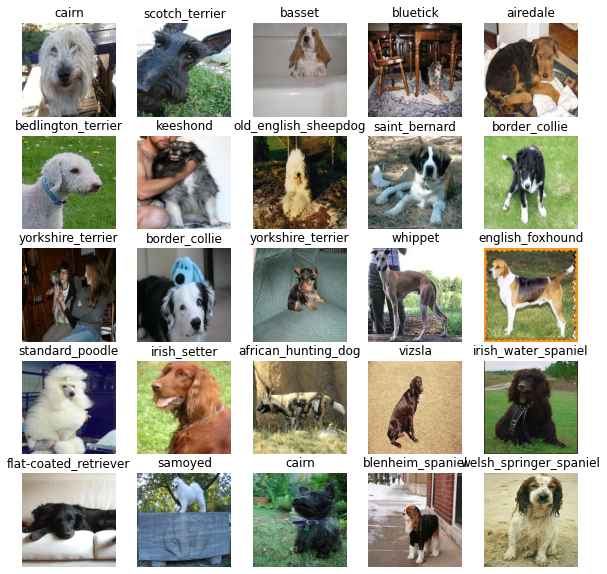

In [23]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training a model using transfer learning


Building a model
Before we build a model, there are a few things we need to define:

>The input shape (images, in the form of Tensors) to our model.

>The output shape (image labels, in the form of Tensors) of our model.

>The URL of the model we want to use.

In [0]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [0]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [26]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

TensorBoard Callback

TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
import datetime
import os 

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

Early Stopping Callback

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

In [0]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

Training a model

In [0]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 10 #@param {type:"slider", min:10, max:100, step:10}

In [0]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [32]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
25/25 [==============================] - 5s 191ms/step - loss: 4.6448 - accuracy: 0.0775 - val_loss: 3.5680 - val_accuracy: 0.2450
Epoch 2/10
25/25 [==============================] - 4s 174ms/step - loss: 1.6759 - accuracy: 0.6725 - val_loss: 2.2858 - val_accuracy: 0.4600
Epoch 3/10
25/25 [==============================] - 4s 176ms/step - loss: 0.5723 - accuracy: 0.9312 - val_loss: 1.7719 - val_accuracy: 0.5650
Epoch 4/10
25/25 [==============================] - 4s 174ms/step - loss: 0.2518 - accuracy: 0.9875 - val_loss: 1.5649 - val_accuracy: 0.6200
Epoch 5/10
25/25 [==============================] - 4s 176ms/step - loss: 0.1460 - accuracy: 0.9987 - val_loss: 1.4901 - val_accuracy: 0.6200
Epoch 6/10
25/25 [==============================] - 4s 173ms/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.4445 - val_accuracy: 0.6250
Epoch 7/10
25/25 [==============================] - 4s 

Checking the TensorBoard logs

Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

In [33]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

In [34]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 110ms/step


array([[1.0196557e-03, 8.1425984e-05, 3.5254932e-03, ..., 1.4740320e-04,
        9.6160848e-06, 1.9381634e-03],
       [5.9948041e-04, 5.3723605e-04, 7.6843477e-03, ..., 1.6832064e-03,
        3.5383806e-03, 2.3068232e-04],
       [8.0390100e-06, 1.8772827e-05, 4.4058022e-05, ..., 6.0633977e-04,
        3.9468962e-04, 5.5612822e-05],
       ...,
       [1.1012622e-04, 3.4329790e-04, 3.4382279e-04, ..., 1.5608280e-04,
        3.1465676e-04, 3.2309236e-04],
       [9.4379991e-04, 4.4119425e-04, 2.7664527e-04, ..., 2.3401983e-04,
        2.9133252e-04, 2.7033264e-02],
       [9.5738866e-04, 2.0754813e-05, 1.3026323e-03, ..., 3.7718338e-03,
        2.2801235e-03, 6.8820249e-05]], dtype=float32)

In [35]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [36]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[1.01965573e-03 8.14259838e-05 3.52549320e-03 2.14581683e-04
 8.00745693e-05 2.17976660e-04 2.42071599e-02 8.93484801e-04
 3.79507255e-05 4.19956486e-04 1.74650850e-04 3.54092539e-04
 8.14657469e-05 1.65429839e-04 1.29561391e-04 1.90167324e-04
 8.57604609e-05 2.17061862e-01 8.96271158e-05 1.64985304e-05
 6.53523777e-04 7.79261463e-05 1.27131252e-05 8.32820951e-04
 1.87239220e-05 1.68688159e-04 5.11242807e-01 1.41608780e-05
 3.45930421e-05 9.66920561e-05 1.12433670e-04 2.54476373e-03
 2.29502082e-04 2.88579558e-05 3.79593053e-04 1.85621940e-02
 4.40155964e-05 5.22042501e-05 1.07462110e-04 7.54366847e-05
 3.39074875e-04 2.11602201e-05 5.46624906e-05 8.48610125e-06
 1.33260051e-04 5.69734475e-05 8.74844700e-05 3.20136278e-05
 2.31379425e-04 3.02697972e-05 1.94737629e-04 2.45261617e-05
 7.40265124e-04 5.43078095e-05 1.57186005e-05 1.86071748e-06
 9.58263918e-05 5.46361727e-04 9.85752093e-04 2.68829279e-02
 1.57017363e-04 5.05492862e-05 1.59094075e-03 6.50826905e-06
 5.68677089e-04 9.337806

In [37]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

In [38]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.

Convert the prediction probabilities to a predicted label.

Plot the predicted label, its predicted probability, the truth label and target image on a single plot

In [0]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

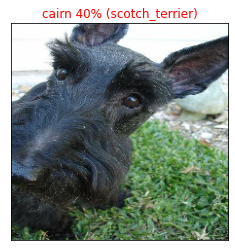

In [40]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.

Find the predicted label using get_pred_label().

Find the top 10:

Prediction probabilities indexes

Prediction probabilities values

Prediction labels

Plot the top 10 prediction probability values and labels, coloring the true label green.

In [0]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

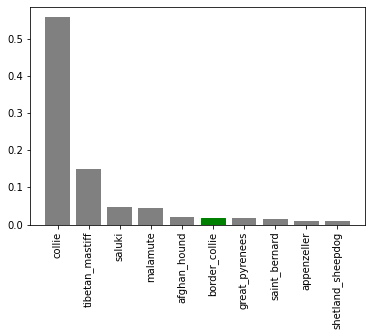

In [42]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

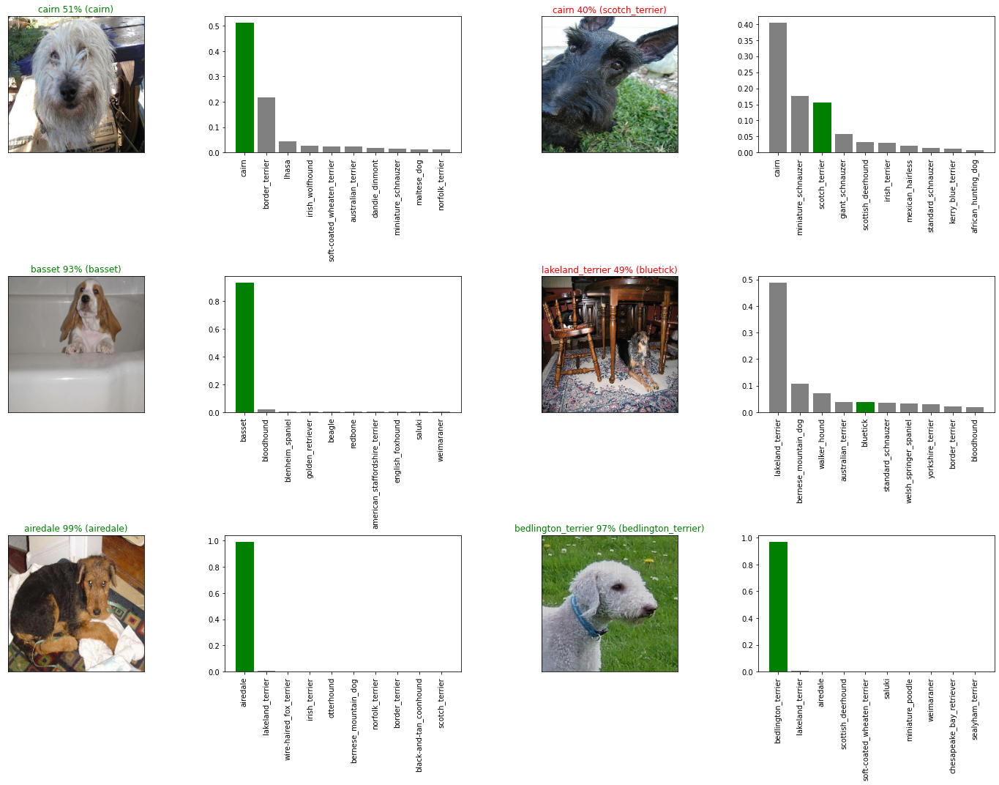

In [43]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Saving and reloading a model

In [0]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

Load the model

In [0]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [46]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20200601-12401591015244-1000-images-Adam.h5...


'drive/My Drive/Dog Vision/models/20200601-12401591015244-1000-images-Adam.h5'

In [47]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/My Drive/Dog Vision/models/20200601-11421591011763-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20200601-11421591011763-1000-images-Adam.h5



Compare the two models (the original one and loaded one). We can do so easily using the evaluate() method.

In [48]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 101ms/step - loss: 1.3444 - accuracy: 0.6400


[1.3444221019744873, 0.6399999856948853]

In [49]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 124ms/step - loss: 1.2296 - accuracy: 0.6700


[1.229648470878601, 0.6700000166893005]

## Training a model (on the full data)

In [50]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [51]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [52]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [0]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [54]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

In [55]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/10
320/320 [==============================] - 1138s 4s/step - loss: 1.3162 - accuracy: 0.6741
Epoch 2/10
320/320 [==============================] - 46s 143ms/step - loss: 0.3955 - accuracy: 0.8824
Epoch 3/10
320/320 [==============================] - 45s 140ms/step - loss: 0.2351 - accuracy: 0.9350
Epoch 4/10
320/320 [==============================] - 45s 141ms/step - loss: 0.1516 - accuracy: 0.9613
Epoch 5/10
320/320 [==============================] - 45s 140ms/step - loss: 0.1033 - accuracy: 0.9797
Epoch 6/10
320/320 [==============================] - 45s 140ms/step - loss: 0.0788 - accuracy: 0.9848
Epoch 7/10
320/320 [==============================] - 45s 140ms/step - loss: 0.0581 - accuracy: 0.9913
Epoch 8/10
320/320 [==============================] - 45s 141ms/step - loss: 0.0447 - accuracy: 0.9944
Epoch 9/10
320/320 [==============================] - 46s 144ms/step - loss: 0.0365 - accuracy: 0.9968
Epoch 10/10
320/320 [==============================] - 45s 141ms/step - lo

Saving and reloading the full model

In [56]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20200601-13061591016806-all-images-Adam.h5...


'drive/My Drive/Dog Vision/models/20200601-13061591016806-all-images-Adam.h5'

In [58]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20200601-13061591016806-all-images-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20200601-13061591016806-all-images-Adam.h5


Making predictions on the test dataset

In [59]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/My Drive/Dog Vision/test/ea057ca7f831d161d456091bf293e4b1.jpg',
 'drive/My Drive/Dog Vision/test/f1705303b30da3a48db2a5f34376b947.jpg',
 'drive/My Drive/Dog Vision/test/edbff7f90e9b8f5dd4cf25ce67fa2efa.jpg',
 'drive/My Drive/Dog Vision/test/e995cbf5f2c4da27a1e56966c70de380.jpg',
 'drive/My Drive/Dog Vision/test/f453249b8fff37e92e02fce0d662ffa0.jpg',
 'drive/My Drive/Dog Vision/test/ecd186a42dd0ec3f78aa3d4fa56b8ea0.jpg',
 'drive/My Drive/Dog Vision/test/f4eb6450497df847ef1012d61d869007.jpg',
 'drive/My Drive/Dog Vision/test/ec63d4730c5cf4b75227e103fea054c3.jpg',
 'drive/My Drive/Dog Vision/test/e93dde9e36ff6a41cd0e72fb01703be6.jpg',
 'drive/My Drive/Dog Vision/test/ee7bdce4ac4008b3551ca66f82712e31.jpg']

In [60]:
# How many test images are there?
len(test_filenames)

10357

In [61]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [62]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 6582s 20s/step


In [65]:
# Check out the test predictions
test_predictions[:10]

array([[4.9483304e-05, 4.7194394e-08, 7.4214048e-09, ..., 1.8753821e-07,
        1.8027730e-06, 1.6526112e-04],
       [1.3130803e-10, 8.3480001e-05, 1.0485232e-07, ..., 4.1110115e-03,
        8.3533877e-08, 7.6436945e-06],
       [4.7106913e-04, 2.0526537e-05, 3.0161811e-05, ..., 5.6759040e-05,
        5.1777076e-04, 1.0060785e-04],
       ...,
       [5.2742489e-06, 6.2549745e-08, 6.1670653e-07, ..., 2.0303398e-01,
        1.7372486e-06, 2.2588034e-07],
       [2.1686665e-10, 4.9929637e-11, 6.7498923e-10, ..., 1.6194452e-11,
        5.5321409e-10, 2.6693225e-10],
       [7.9457013e-06, 1.7000754e-09, 3.8479371e-08, ..., 2.3768173e-07,
        3.2641685e-03, 3.2923824e-06]], dtype=float32)

Making predictions on custom images
It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:

Get the filepaths of our own images.
Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
Pass the custom image data batch to our model's predict() method.
Convert the prediction output probabilities to prediction labels.
Compare the predicted labels to the custom images.
Note: To make predictions on custom images, I've uploaded pictures of my own to a directory located at drive/My Drive/Data/dogs/ (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [0]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [67]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [68]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

InvalidArgumentError: ignored

In [0]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [69]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

InvalidArgumentError: ignored

In [70]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

<Figure size 720x720 with 0 Axes>